<a href="https://colab.research.google.com/github/johnny314159/ECSE415_Fall2021/blob/main/Assignment%202/ECSE415_A2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#path variable
path = '/content/drive/My Drive/' #see README.md

#Notebook by Johnny Liu, ID 260800456

#Import libraries, access image path
from google.colab import drive

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import copy

%matplotlib inline

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
print('Numpy Version:', np.version.version, 
      'OpenCV Version:', cv2.__version__,
      "Matplotlib Version:", matplotlib.__version__)

Numpy Version: 1.19.5 OpenCV Version: 4.5.4-dev Matplotlib Version: 3.2.2


In [ ]:
#for SIFT. need to run in order for this code to work, install in terminal
!pip install opencv-contrib-python==4.5.4.58

# Q1. Harris Corner Detection


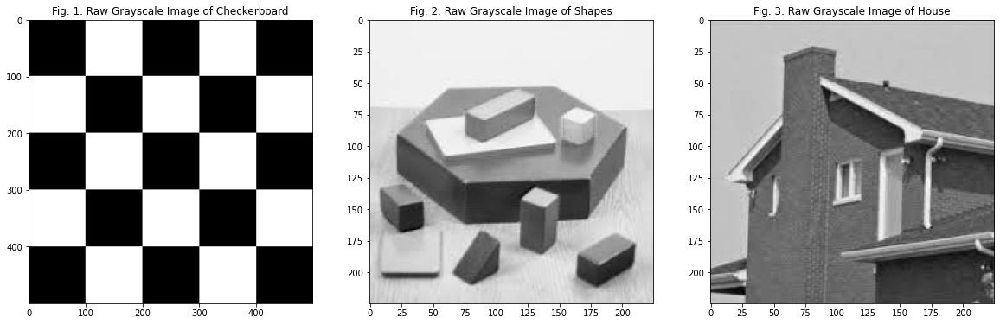

In [ ]:
#import images
q1_checker = cv2.imread(path + 'q1.1.jpg')
q1_shape = cv2.imread(path+ 'q1.2.png')
q1_house = cv2.imread(path+ 'q1.3.png')

#for plotting original images
image = [q1_checker, q1_shape, q1_house]
image_name = ['Checkerboard','Shapes','House']
fig, axs = plt.subplots(ncols = 3, figsize=(20,10))

counter = 1
for i in range(0,3):
  axs[i].imshow(image[i],cmap='gray')
  str = ('Fig. {}. Raw Grayscale Image of {}').format(counter, image_name[i])
  axs[i].set_title(str)
  counter +=1
counter = counter

In [ ]:
def Harris_Corner(img, kernel_size, circle_size, threshold, sigma = 1, k = 0.05):
  input = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  img_disp = img.copy()
  #1.1.1 gaussian filtering
  gauss_filtered = cv2.GaussianBlur(input, (kernel_size, kernel_size), sigma)

  #1.1.2 image derivatives
  I_x = cv2.Sobel(gauss_filtered, cv2.CV_64F, 1, 0, ksize = kernel_size)
  I_y = cv2.Sobel(gauss_filtered, cv2.CV_64F, 0, 1, ksize = kernel_size)
  
  #1.1.3 square of derivatives
  I_x2 = I_x * I_x
  I_y2 = I_y * I_y
  I_xy = I_x * I_y
  #gaussian on square of derivatives
  I_x2 = cv2.GaussianBlur(I_x2, (kernel_size, kernel_size), sigma)
  I_y2 = cv2.GaussianBlur(I_y2, (kernel_size, kernel_size), sigma)
  I_xy = cv2.GaussianBlur(I_xy, (kernel_size, kernel_size), sigma)

  #1.1.4cornerness
  H = ([[I_x2, I_xy], [I_xy, I_y2]])
  det = (I_x2 * I_y2) - (I_xy * I_xy)
  tr = I_x2 + I_y2
  cornerness = det - k * (tr**2)

  #1.1.5 non-max supression:
  def non_max_suppression(input):
    M, N = input.shape
    nms = np.zeros_like(input)
    for i in range(0, M - 2):
      for j in range(0, N - 2):
        nms[i,j] = np.max(input[i:i+kernel_size, j:j+kernel_size])

    cornerness_nms = np.zeros_like(input)
    for i in range(0, M):
      for j in range(0, N):
        if input[i,j] >= nms[i,j]:
          cornerness_nms[i,j] = input[i,j]
        else:
          cornerness_nms[i,j] = 0
    return cornerness_nms

  output = non_max_suppression(cornerness)
  
  #normalize:
  cv2.normalize(output, output, 0, 1, cv2.NORM_MINMAX)

  #1.1.6 threshold
  loc = np.where(output >= threshold)

  #loop through points and draw circles
  for pt in zip(*loc[::-1]):
    cv2.circle(img_disp, pt, circle_size, (255,0,0), -1)
  
  #plot
  axs[t].imshow(img_disp)
  
  str = ('Fig. {}. Detected Corner for {} (Threshold = {})').format(counter, image_name[n], threshold_array[n][t])
  axs[t].set_title(str)
  return 


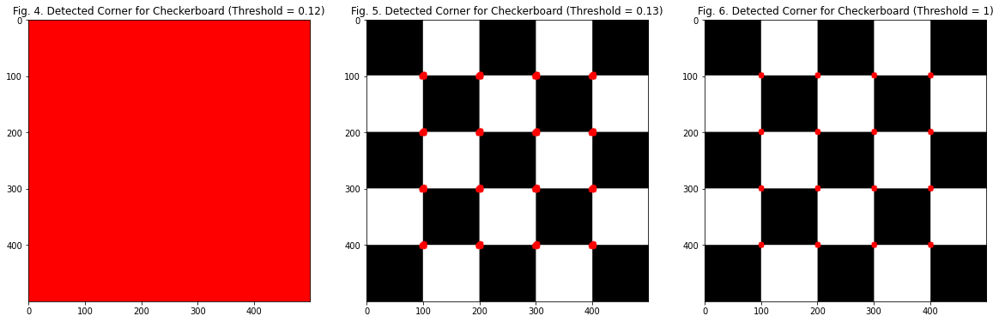

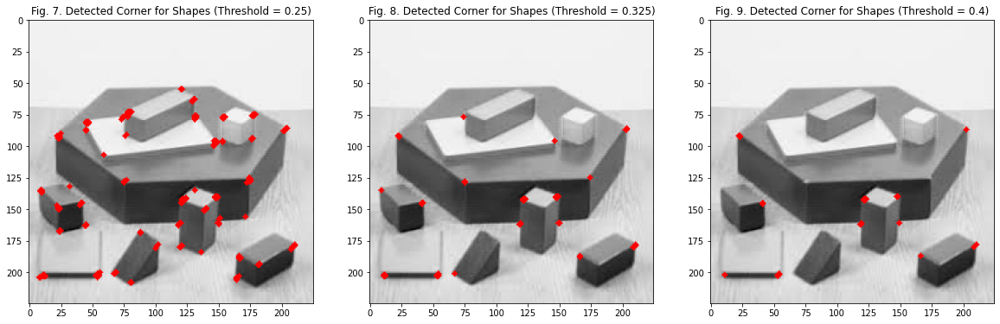

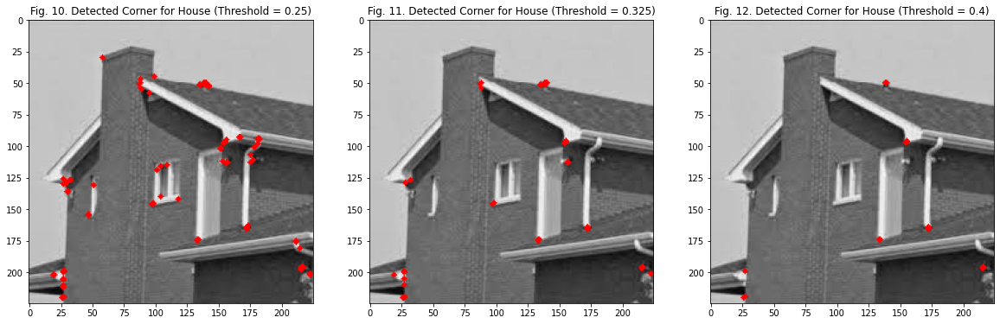

In [ ]:
#set params for Harris_Corner

kernel_size = [3, 3, 3]
circle_size = [5, 2, 2]
threshold_array = [[0.12, 0.13, 1],[0.25, 0.325, 0.4],[0.25, 0.325, 0.4]]
#1.2.1-3
#iterate through params to produce plot

for n in range(0, 3):
  fig, axs = plt.subplots(ncols = 3, sharex=True, figsize=(20,10))
  for t in range(0, 3):
    Harris_Corner(image[n], kernel_size[n], circle_size[n], threshold_array[n][t])
    counter = counter+1

**Discussion for Q1**

**Q1, Pt. 1:** Since the corners on a checkerboard are obvious and identical, thresholding is a binary process: either all or none of the corners are detected. Figs. 4 and 5 show that the minimum threshold necessary is between 0.12 and 0.13. Even at a threshold of 1, all the corners are detected (Fig. 6), although the circle drawn are somewhat smaller than a threshold of 0.13 (Fig. 5)

**Q1, Pt. 2:** 3 threshold values were used, 0.25, 0.325 and 0.4 corresponding to Figs. 7, 8 & 9 respectively. A threshold of 0.25 detected most of the corners in the image, although at some corners there is a bit of noise / repetition. A threshold of 0.325 failed to detect about a third of corners, with little noise. A threshold of 0.4 detected only about a third of all corners.

**Q1, Pt. 3:** 3 threshold values were used, 0.25, 0.325 and 0.4 corresponding to Figs. 10, 11 & 12 respectively. A threshold of 0.25 failed to detect some corners and has noise around some other corners. A threshold of 0.325 deteced even fewer corners, with less noise. A threshold of 0.4 detected the least amount of corners but has no noise / close nearby circles.

# Q2. Invariance of SIFT Features

**2.1 Invariance Under Scale**


In [ ]:
#import and convert to RGB
q2_book = cv2.imread(path + 'book.png')
q2_book_RGB = cv2.cvtColor(q2_book, cv2.COLOR_BGR2RGB)
img_disp_RGB = q2_book_RGB.copy()

"""
uncomment to plot
fig, axs = plt.subplots(ncols = 2, sharex=True, figsize=(10,5))
axs[0].imshow(q2_book)
axs[0].set_title("OpenCV Input Image")
axs[1].imshow(q2_book_RGB)
axs[1].set_title("RGB Image")
"""
#instantiate SIFT object
sift = cv2.xfeatures2d.SIFT_create()
#2.1.1
#compute sift keypoints + descriptors
keypoints, descriptors = sift.detectAndCompute(q2_book_RGB,None)

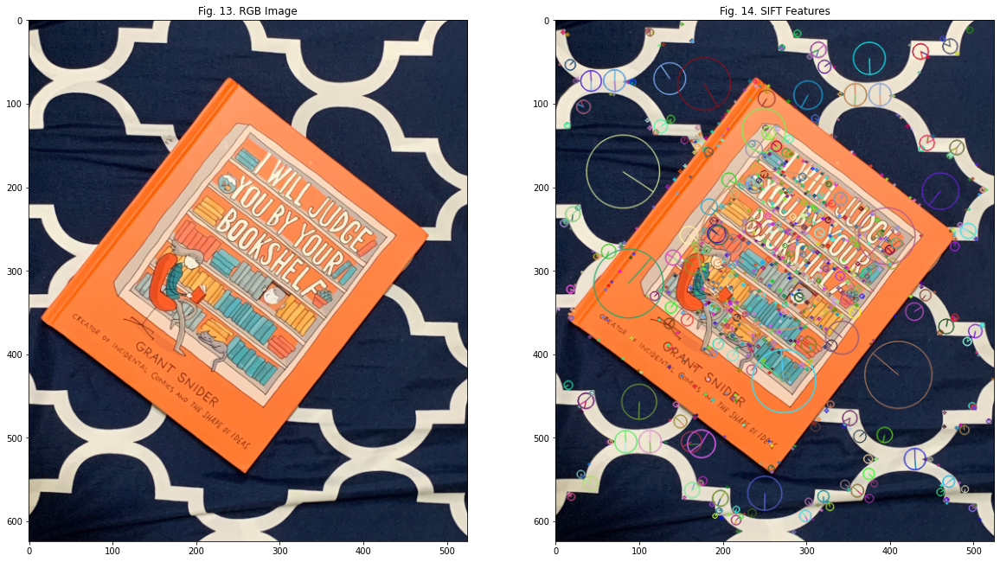

In [ ]:
#draw keypoints on reference image
cv2.drawKeypoints(q2_book_RGB, keypoints, img_disp_RGB, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

#display reference image
fig, axs = plt.subplots(ncols = 2, figsize=(20,20))
axs[0].imshow(q2_book_RGB)
axs[1].imshow(img_disp_RGB)
str = ('Fig. {}. RGB Image').format(counter)
counter+=1
axs[0].set_title(str)
str = ('Fig. {}. SIFT Features').format(counter)
axs[1].set_title(str)
counter+=1

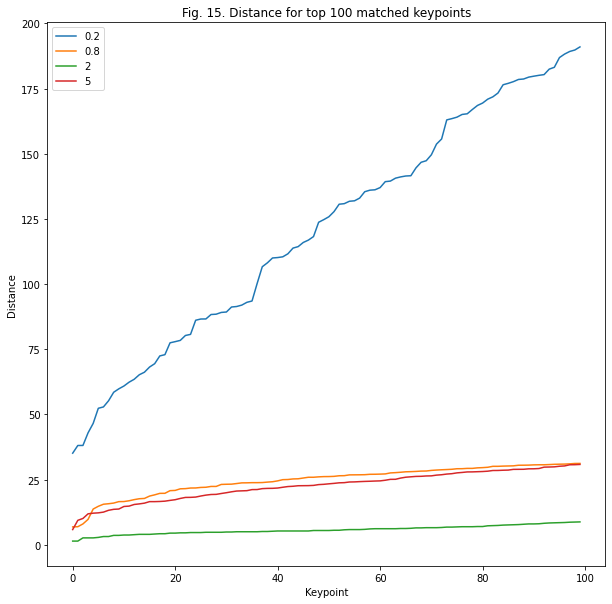

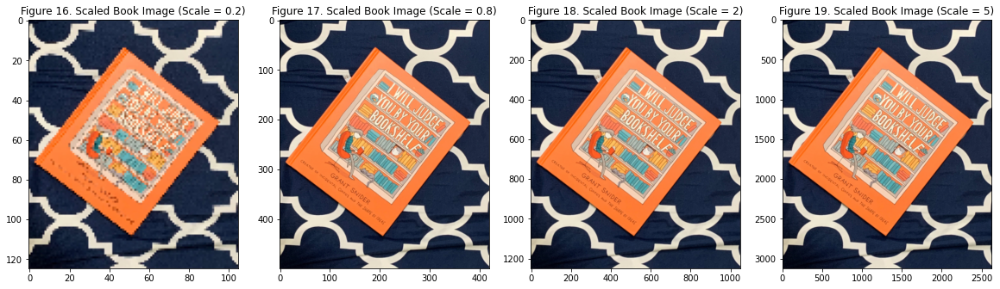

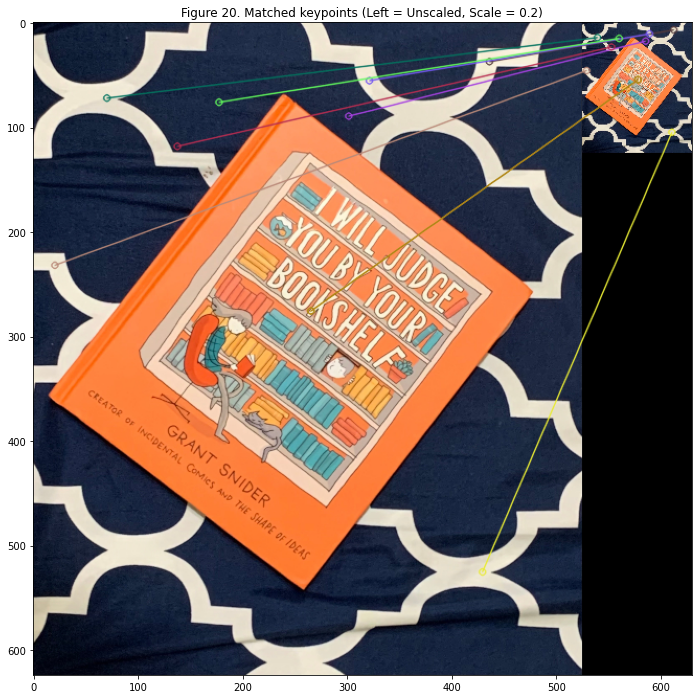

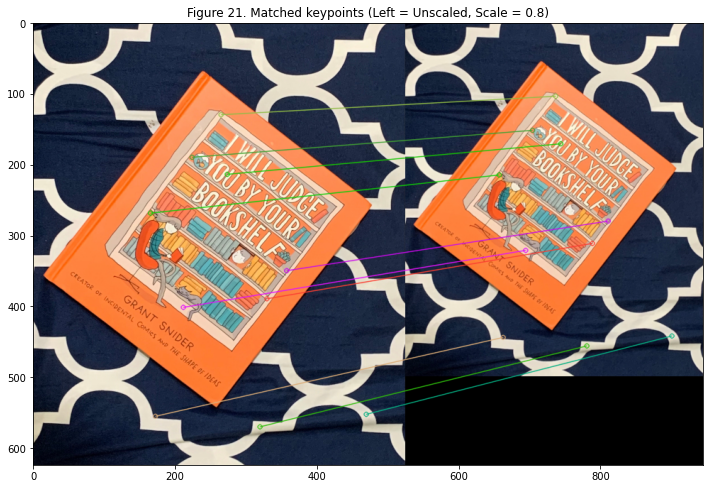

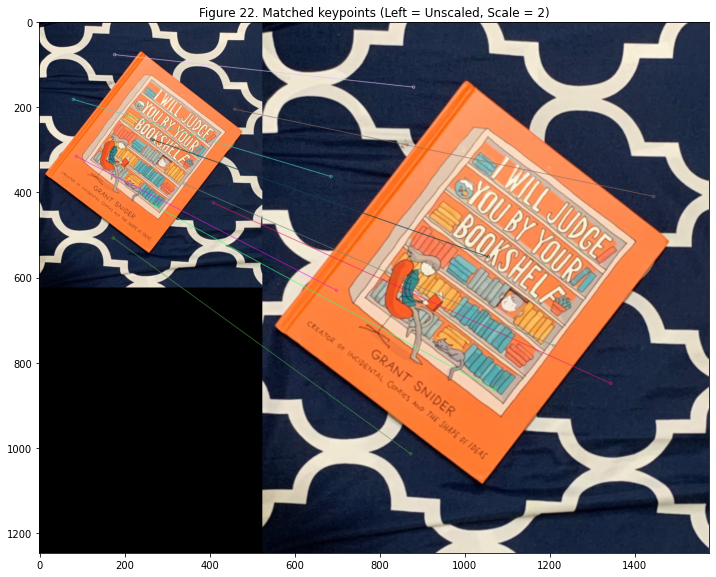

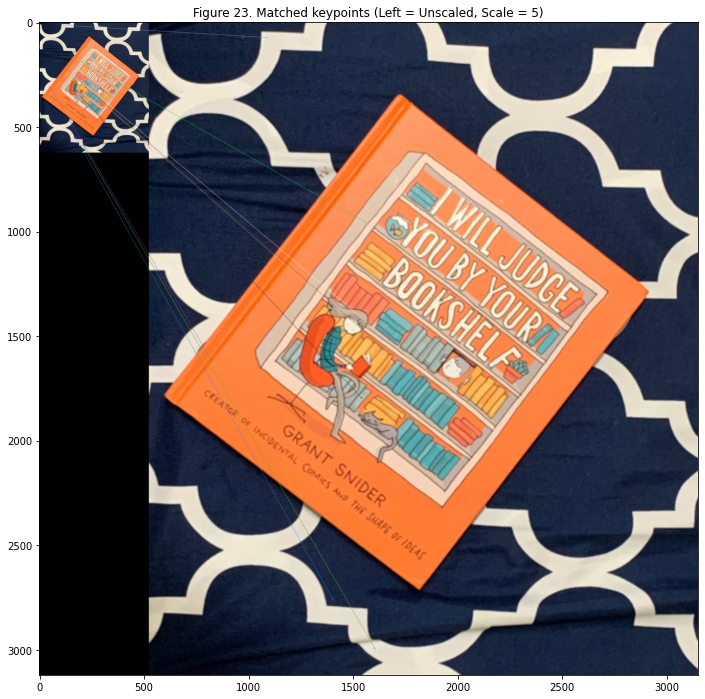

In [ ]:
#counter = 15
scale_factors = [0.2, 0.8, 2, 5]

#initialize
q2_scaled = [[]*len(q2_book_RGB) for i in range(len(scale_factors))]
keypoints_scaled, descriptors_scaled = [], []

#initialize distance plot (2.1.6)
fig2, ax = plt.subplots(1,1, figsize=(10,10)) #plot for distance comparison
str = ('Fig. {}. Distance for top 100 matched keypoints').format(counter)
ax.set_title(str)
ax.set_xlabel('Keypoint')
ax.set_ylabel('Distance')
counter += 1

#show scaled images
fig, axs = plt.subplots(ncols = 4, figsize=(20,20))
for i, val in enumerate(scale_factors):
  q2_scaled[i] = cv2.resize(q2_book_RGB, None, fx = val, fy = val)
  axs[i].imshow(q2_scaled[i])
  str = ('Figure {}. Scaled Book Image (Scale = {})').format(counter, scale_factors[i])
  axs[i].set_title(str)
  counter += 1

#iterate through all 4 factors
for i, val in enumerate(scale_factors):
  #2.1.2 scale @ scale factor & display scaled images
  q2_scaled[i] = cv2.resize(q2_book_RGB, None, fx = val, fy = val)
 
  #2.1.3 compute keypoints + descriptors
  keypoints_scaled, descriptors_scaled = sift.detectAndCompute(q2_scaled[i], None) #temp vars

  #2.1.4 brute force match 
  brute_force = cv2.BFMatcher()
  matches = brute_force.match(descriptors, descriptors_scaled) 

  #2.1.5 sort matches
  matches = sorted(matches, key = lambda match: match.distance)

  #2.1.6 distance plot 
  indices = []
  indices = matches
  ax.plot([m.distance for m in matches[:100]])
  ax.legend(scale_factors)

  
  #2.1.7 draw top 10 matches
  q2_scaled_out = cv2.drawMatches(q2_book_RGB, keypoints, q2_scaled[i], keypoints_scaled, matches[:10], None, flags=2)
  plt.figure(figsize = (12,12))
  plt.imshow(q2_scaled_out)
  str = ('Figure {}. Matched keypoints (Left = Unscaled, Scale = {})').format(counter, scale_factors[i])
  plt.title(str)
  counter+=1


**Q2.1.8: Discuss the trend in the plotted results. What is the effect of increasing the scale on the matching distance? Reason as to the cause.**

* As scale increases from 0.2 to 0.8 and 2, the performance 
increases: the distance between the xth best match and the (x+1)th best match (matching distance) increases less and less, so there are better matches.
* As scale goes from 2 to 5, the performance once again decreases, suggesting that there is a local maximum of performance between 0.8 and 5. 
* As shown in Fig. 15, a scale of 2 performs very well, 0.8 and 5 perform decently, and 0.2 performs terribly.
  * This is because a scale of 0.2 loses too much information (see Fig. 16)
  * A scale of 0.8 loses some information
  * A scale of 2 provides a lot of extra pixels for the SIFT detector
  * A scale of 5 is too big that despite the increased pixels, there is such a big discrepancy between the scaled image and the reference image (see Fig. 23) that the distance increases again.


**Invariance under Rotation**

Same as invariance under scale, except using four rotation angles: (10, 90, 130, 180)

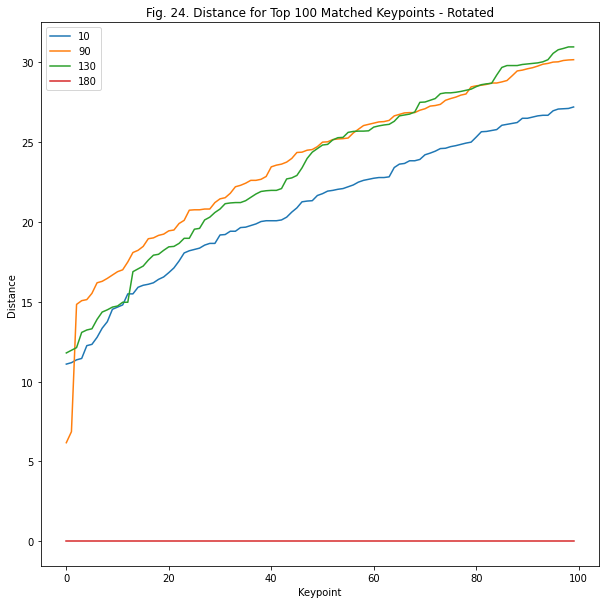

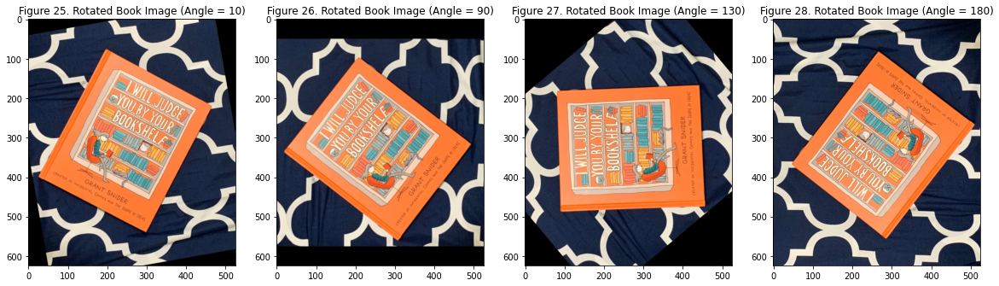

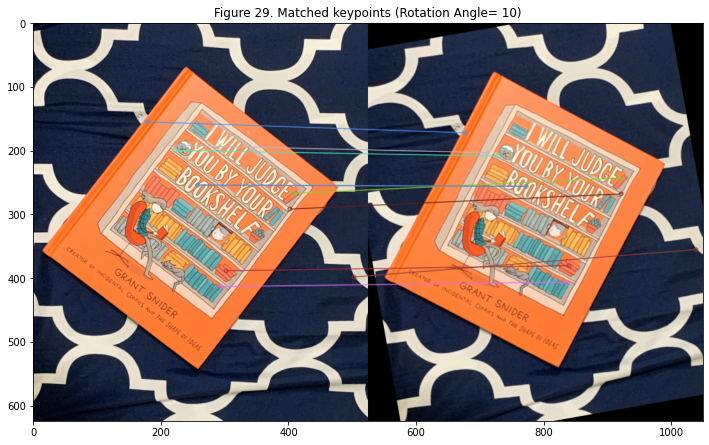

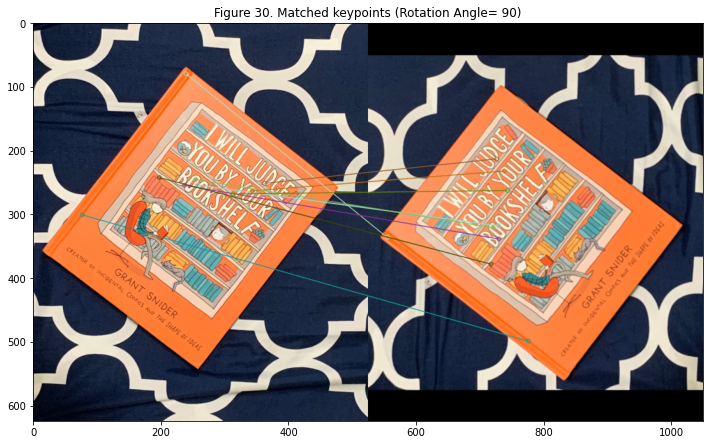

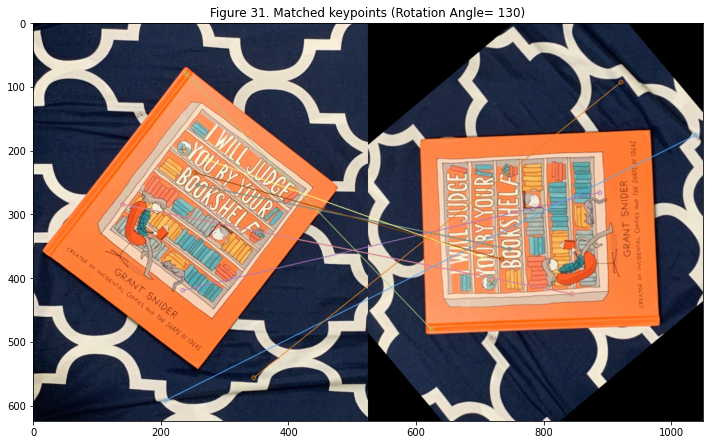

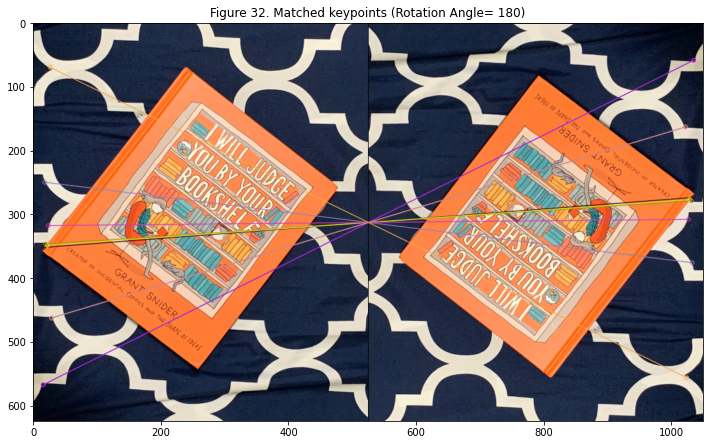

In [ ]:
#2.2.1: computer SIFT keypoints
keypoints, descriptors = sift.detectAndCompute(q2_book_RGB,None)

#initialize values
rotation_angles = [10, 90, 130, 180]
height, width = q2_book_RGB.shape[0:2]
counter = 24
q2_rotated = [[]*len(q2_book_RGB) for i in range(len(rotation_angles))]
keypoints_rotated, descriptors_rotated = [], []

#initialize distance plot (2.2.6)
fig3, ax3 = plt.subplots(1,1, figsize=(10,10)) #plot for distance comparison
str = ('Fig. {}. Distance for Top 100 Matched Keypoints - Rotated').format(counter)
ax3.set_title(str)
ax3.set_xlabel('Keypoint')
ax3.set_ylabel('Distance')
counter += 1

#display rotated images
fig, axs = plt.subplots(ncols = 4, figsize=(20,20))
for i, val in enumerate(rotation_angles):
  M = cv2.getRotationMatrix2D((width/2,height/2), val, 1)
  q2_rotated[i] = cv2.warpAffine(q2_book_RGB,M,(width,height))
  axs[i].imshow(q2_rotated[i])
  str = ('Figure {}. Rotated Book Image (Angle = {})').format(counter, rotation_angles[i])
  axs[i].set_title(str)
  counter += 1

for i, val in enumerate(rotation_angles):
  #2.2.2 rotate
  M = cv2.getRotationMatrix2D((width/2,height/2), val, 1)
  q2_rotated[i] = cv2.warpAffine(q2_book_RGB,M,(width,height))

  #2.2.3 SIFT keypoints for rotated
  keypoints_rotated, descriptors_rotated = sift.detectAndCompute(q2_rotated[i], None) #temp vars

  #2.2.4 brute force match 
  matches_rotated = brute_force.match(descriptors, descriptors_rotated) 

  #2.2.5 sort matches
  matches_rotated = sorted(matches_rotated, key = lambda match: match.distance)

  #2.2.6 distance plot 
  indices_rotated = []
  indices_rotated = matches_rotated
  ax3.plot([match.distance for match in matches_rotated[:100]])
  ax3.legend(rotation_angles)

  #2.2.7 draw top 10 matches
  q2_rotated_out = cv2.drawMatches(q2_book_RGB, keypoints, q2_rotated[i], keypoints_rotated, matches_rotated[:10], None, flags=2)
  plt.figure(figsize = (12,12))
  plt.imshow(q2_rotated_out)
  str = ('Figure {}. Matched keypoints (Rotation Angle= {})').format(counter, rotation_angles[i])
  plt.title(str)
  counter+=1

**Q2.2.8 Discuss the trend in the plotted results. What is the effect of increasing the angle of rotation on the matching distance? Reason as to the cause.**

*   As with Q 2.1.8, consider performance as minimal increase of match distance between neighbouring points
*   The trend is as the rotation angle increases from 0 to 90, performance decreases, and as the angle increases from 90 to 180, performance increases again.
  * 180 degrees is a mirror image and thus has a constant distance of 0 (for SIFT, it may as well be 0 degrees)
  * 90 degrees can be thought of as the most "different," although there are some regions where 130 degrees performs worse (keypoint ~0-5 and ~70 onwards on Fig. 24)
  * 10 degrees has the second best performance since it is a small rotation relative to 90 and 130
  



#Q3. Image Stitching


Text(0.5, 1.0, 'Raw Image, View 3')

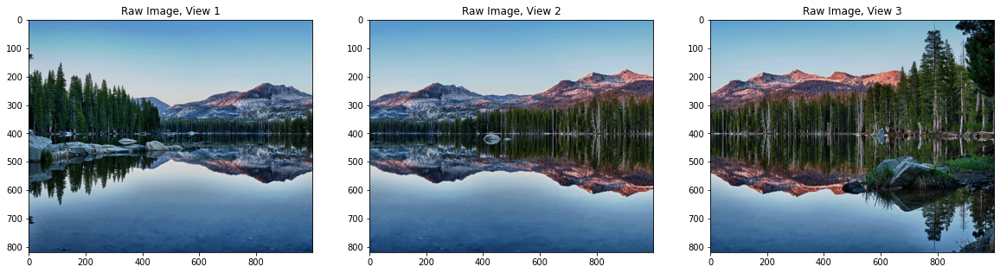

In [ ]:


#import 3 views of the scene
q3_l = cv2.imread(path + 'panorama1.png')
q3_m = cv2.imread(path + 'panorama2.png')
q3_r = cv2.imread(path + 'panorama3.png')

#convert to RGB
q3_l = cv2.cvtColor(q3_l , cv2.COLOR_BGR2RGB)
q3_m = cv2.cvtColor(q3_m , cv2.COLOR_BGR2RGB)
q3_r = cv2.cvtColor(q3_r , cv2.COLOR_BGR2RGB)

#for my own reference, not required
fig, ax = plt.subplots(ncols = 3, figsize = (20, 10))
ax[0].imshow(q3_l)
ax[1].imshow(q3_m)
ax[2].imshow(q3_r)
ax[0].set_title('Raw Image, View 1')
ax[1].set_title('Raw Image, View 2')
ax[2].set_title('Raw Image, View 3')

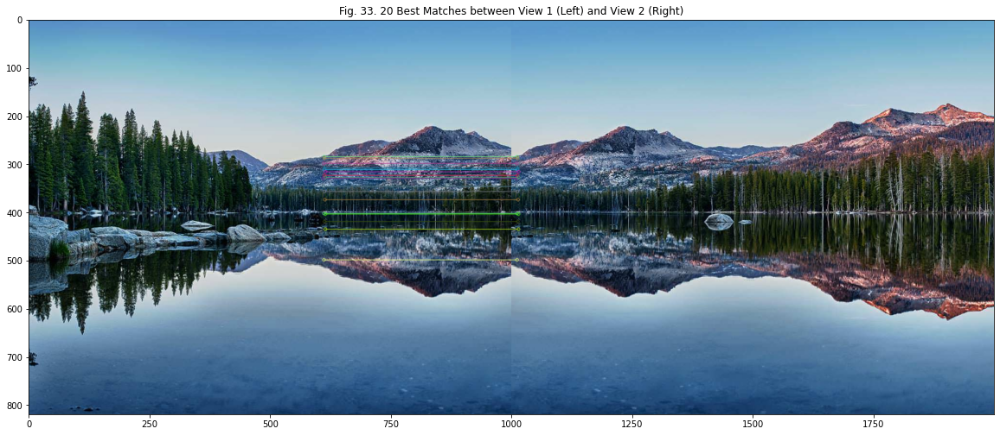

In [ ]:


#3.1 compute SIFT keypoints, descriptors
sift = cv2.xfeatures2d.SIFT_create()
keypoints_l, descriptors_l = sift.detectAndCompute(q3_l,None)
keypoints_m, descriptors_m = sift.detectAndCompute(q3_m,None) 

#3.2 find matching keypoints + display 20 best pairs
brute_force = cv2.BFMatcher()
matches = brute_force.match(descriptors_l, descriptors_m)
matches = sorted(matches, key = lambda match:match.distance)
lm_match = cv2.drawMatches(q3_l, keypoints_l, q3_m, keypoints_m, matches[:20], None, flags=2)

fig, ax = plt.subplots(1,1, figsize=(20,10))
ax.imshow(lm_match)
str = ('Fig. {}. 20 Best Matches between View 1 (Left) and View 2 (Right)').format(counter)
counter += 1
ax.set_title(str)

#3.3 Find homography using RANSAC,apply transformation
#set good matches into 2 lists, mp_m and mp_l
good_matches = []
for i, m in enumerate(matches):
  if m.distance < 1000:
    good_matches.append((m.trainIdx, m.queryIdx))

mp_m = np.float32([keypoints_m[i].pt for (i, __) in good_matches])
mp_l = np.float32([keypoints_l[i].pt for (__, i) in good_matches])


In [ ]:
""" shift the keypoints in training set matches 1000 px to the right. 
otherwise the warpPerspective output appears only as narrow ~400px segment,
i.e. from x = 0 to x = 400. (region from x = ~-600 to 0 is not shown). 
this shift brings the image to x = ~400 to ~1400; the stitching step then
adds in x = 1000 to 2000 with the unwarped middle image.

Only run this cell once otherwise the shift will be too much
"""
for x in range (len(mp_m)):
  mp_m[x][0] += q3_m.shape[1]

Text(0.5, 1.0, 'Figure 34. Image 12 (View 1 stitched with View 2)')

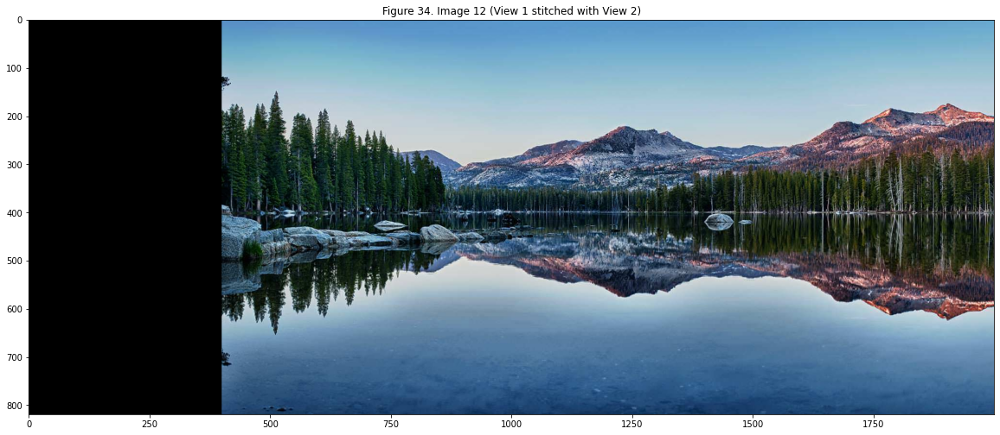

In [ ]:
#obtain homography matrix, warp image 1 (q3_l)
H, __ = cv2.findHomography(mp_l, mp_m, cv2.RANSAC, 4)
dst = cv2.warpPerspective(q3_l, H, ((q3_m.shape[1] + q3_l.shape[1]), q3_l.shape[0]))

#3.4 apply linear stitching with warped image 1 (q3_l) and normal image 2 (q3_m)
dst[:, q3_m.shape[1]:, :] = q3_m
image_12 = dst.copy()
#display image
plt.figure(figsize = (20, 20))
plt.imshow(image_12)
str = ('Figure {}. Image 12 (View 1 stitched with View 2)').format(counter)
counter += 1
plt.title(str)

Text(0.5, 1.0, 'Fig. 35. 20 Best Matches between Image 12 and Image 3 (View 3)')

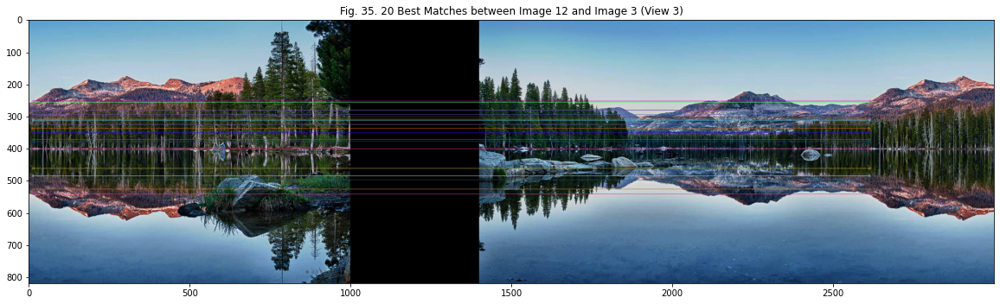

In [ ]:
#3.5 compute SIFT keypoints and descriptors for images 12 and 3

image_3 = q3_r.copy()
keypoints_12, descriptors_12 = sift.detectAndCompute(image_12,None)
keypoints_3, descriptors_3 = sift.detectAndCompute(image_3,None) 

#3.6 find matching keypoints & display 20 best
matches = brute_force.match(descriptors_3, descriptors_12)
matches = sorted(matches, key = lambda match:match.distance)
lm_match = cv2.drawMatches(image_3, keypoints_3, image_12, keypoints_12, matches[:20], None, flags=2)

fig, ax = plt.subplots(1,1, figsize=(20,10))
ax.imshow(lm_match)
str = ('Fig. {}. 20 Best Matches between Image 12 and Image 3 (View 3)').format(counter)
counter += 1
ax.set_title(str)

In [ ]:
#3.7 compute homography, apply transformation to image 3
good = []
for i, m in enumerate(matches):
  if m.distance < 1000:
    good.append((m.queryIdx, m.trainIdx))

mp_3 = np.float32([keypoints_3[i].pt for (i, __) in good]) 
mp_12 = np.float32([keypoints_12[i].pt for (__, i) in good])
H, __ = cv2.findHomography(mp_3, mp_12, cv2.RANSAC, 4)
img123 = cv2.warpPerspective(image_3, H, ((image_3.shape[1] + image_12.shape[1], image_3.shape[0])))

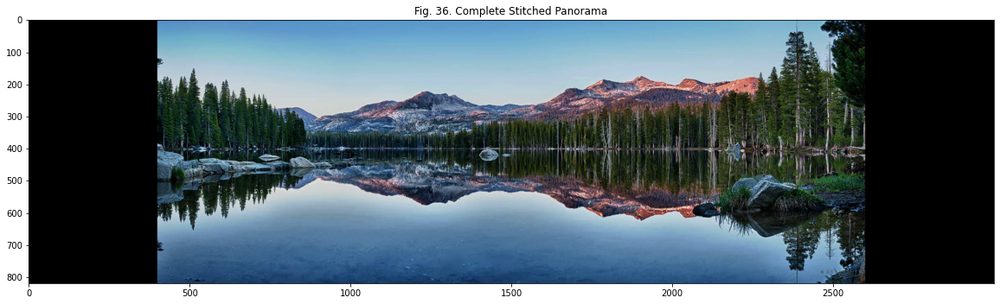

In [ ]:
#3.8 stitch transformed image 3 with old image 12
img123[:, :image_12.shape[1],:] = image_12
plt.figure(figsize = (20,10))
plt.imshow(img123)
str = ('Fig. {}. Complete Stitched Panorama').format(counter)
plt.title(str)
counter += 1

[]

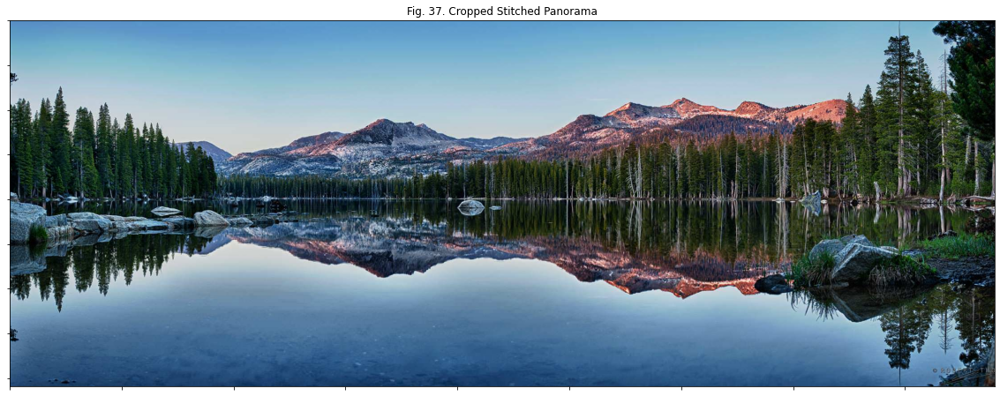

In [ ]:
cropped = img123[:, 400:2600]
plt.figure(figsize = (20, 10))
plt.imshow(cropped)
str = ('Fig. {}. Cropped Stitched Panorama').format(counter)
plt.title(str)
gca= plt.gca()
gca.axes.xaxis.set_ticklabels([])
gca.axes.yaxis.set_ticklabels([])

**Discussion for Q3**

**Q3.9 Note that we could also use multi-band blending in the section 4,8. When should one prefer pyramid blending over linear blending?**

Pyramid blending should be used when there are significant amounts of high frequency variation (such fine lines, details), low frequency variation (such as exposure variations), and especially when there are both. Pyramids such as Laplacian pyramids essentially are band-pass filters, so they provide a good balance between low frequency and high frequency variations. The in class photo by Burt and Adelson (Lecture 7, slide 76) of a man in snowy mountains would be a good example where pyramid blending reduces ghosting while also maintaing detail and smoothness. There are changes in exposure between the reflective snow and dark less reflective rocks, and lots of sharp details. 

Generally, pyramid blending is just better, so as long as the higher computational requirements are justified it can be used. When the blending problem is simple, i.e. there is not too much variation, linear blending is a good option.

# Q4. Image Matching

Using SIFT features show which (if any) of the three objects shown on the left are present in the image on right? (example is from Lowe 1999)
Discuss whether the same can be inferred using just the SSD metric on the images and why?

Text(0.5, 0.98, 'Fig. 38. Three boxes and a scene')

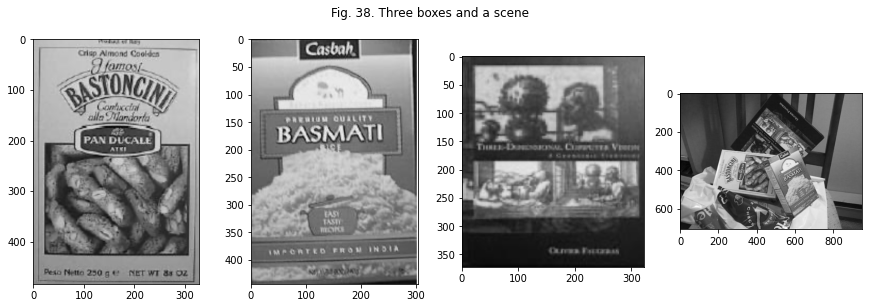

In [ ]:
#load images
q4 = cv2.imread(path + "q4.png")
q4_1 = cv2.imread(path + "q4_1.png")
q4_2 = cv2.imread(path + "q4_2.png")
q4_3 = cv2.imread(path + "q4_3.png")

#convert to RGB
q4 = cv2.cvtColor(q4, cv2.COLOR_BGR2RGB)
q4_1 = cv2.cvtColor(q4_1, cv2.COLOR_BGR2RGB)
q4_2 = cv2.cvtColor(q4_2, cv2.COLOR_BGR2RGB)
q4_3 = cv2.cvtColor(q4_3, cv2.COLOR_BGR2RGB)

img_1 = q4_1.copy()
img_2 = q4_2.copy()
img_3 = q4_3.copy()
img_list = [img_1, img_2, img_3]

#show images
counter = 38
q4_list = [q4_1, q4_2, q4_3, q4]
fig, axs = plt.subplots(1, 4, figsize = (15,4.5))
for i in range(4):
  axs[i].imshow(q4_list[i])
str = ('Fig. {}. Three boxes and a scene').format(counter)
counter += 1
fig.suptitle(str)


In [ ]:
#initialize
kp, des, kp_pile, des_pile = [],[],[],[]


#estimate mask areas
mask0 = np.zeros((q4.shape[0], q4.shape[1]), dtype=np.uint8)

#image, start, end, colour,-1 to fill
start_end = [[(220,300), (550,550)],
             [(450,300), (750,650)],
             [(300,20), (700,380)]]
mask1 = cv2.rectangle(mask0, start_end[0][0], start_end[0][1], 255 , thickness = -1)
mask2 = cv2.rectangle(mask0, start_end[1][0], start_end[1][1], 255, thickness = -1)
mask3 = cv2.rectangle(mask0, start_end[2][0], start_end[2][1],255, thickness = -1)
masks = [mask1, mask2, mask3]
counter = 39

#compute SIFT keypoints/descriptors
def SIFT_match(i, x_best, count):
  """
  i is used to iterate through a list of images
  x_best = number of best points to be drawn
  counter is just used to set the figure numbers
  """
  q4_copy = q4.copy()
  counter = count
  kp, des = sift.detectAndCompute(q4_list[i], None)
  kp_pile, des_pile = sift.detectAndCompute(q4_list[3], masks[i])

  #similar workflow as q2/q3
  #match features
  bf = cv2.BFMatcher()
  matches = bf.match(des, des_pile)

  #sort distance
  matches = sorted(matches, key = lambda match:match.distance)

  #draw x keypoints
  draw_match = cv2.drawMatches(q4_list[i], kp, q4_list[3], kp_pile, matches[:x_best], None, flags = 2)
  
  #draw mask on original image & show mask location
  img_mask = cv2.rectangle(q4_copy, start_end[i][0], start_end[i][1], 255, thickness = 4)
  fig, ax = plt.subplots(ncols = 2, figsize=(20,12))
  ax[0].imshow(draw_match)
  str = ('Fig. {}. Top {} Sift Keypoints for Box {}').format(counter, x_best, i+1)
  ax[0].set_title(str)
  counter += 1
  str = ('Fig. {}. Mask Location for Box {}').format(counter, i+1)
  counter += 1
  ax[1].set_title(str)
  ax[1].imshow(img_mask)
 
  #compute homography, starting with 2 lists method
  good = []
  for j, m in enumerate(matches):
    if m.distance < 1000:
      good.append((m.trainIdx, m.queryIdx))
  
  mpi = np.float32([kp[j].pt for (__,j) in good])
  mp4 = np.float32([kp_pile[j].pt for (j,__) in good])
  
  H, __ = cv2.findHomography(mpi, mp4, cv2.RANSAC, 4)
  dst = cv2.warpPerspective(q4_list[i], H, (q4_list[i].shape[1] + q4.shape[1], q4.shape[0]))

  #draw over the original pile image with any detected objects
  out = q4.copy()
  for x in range(out.shape[0]):
    for y in range(out.shape[1]):
      for z in range(out.shape[2]):
        if dst[x,y,z] > 0:
          out[x,y,z] = dst[x,y,z]
  
  
  fig1, ax1 = plt.subplots(ncols = 2, figsize = (20,12))
  ax1[0].imshow(out)
  ax1[1].imshow(q4)
  str = ('Fig. {}. Box {} shown in pile.').format(counter, i+1)
  ax1[0].set_title(str)
  str = ('Original Pile Image for Comparison')
  ax1[1].set_title(str)

In [ ]:
for i in range(3):
  SIFT_match(i, 20, counter + 3*i)

**Q4 Discussion**

All three objects (boxes) are present in the image pile. After applying homography/warpPerspective on a specific object, the object goes into the forreground and is no longer occluded (Figs. 41, 44 and 47)

**Can the same be inferred using just the SSD metric on the images?**

Using the SSD metric means looking for a high sum of squared differences value (SSD) to detect features which are fairly invariant to shifting and rotation (i.e., it looks for corners).
The weakness of using the SSD metric arise when corners are hard to detect, when scale changes, or with affine transformations.

It would be easiest to match box 2 (the basmati rice) with the SSD metric, since it has the most number of corners, is not occluded, although there is a slight affine transformation (it is resting on top of other boxes at an angle). The "bastonicini" (box 1) object would be more difficult since only one corner is clearly visible and is no longer 90 degrees, a sign of an affine transformation. The textbook appears to have minimal affine transformation, but a large part of it is occluded making corners very hard to detect - it wouldn't have a high SSD metric at all.

Therefore, while SSD could work on one of the three objects, it performs much worse than SIFT which is able to detect all three objects.